# Capstone Project: Smart Pantry Chef
-----------------------------------
Group ID : CC25-CF348
- MC002D5X1710 Tahira Aliyya
- MC002D5X1313 Salwa Sabira
- MC002D5Y0775 Ghaisan Zaki Pratama
- FC787D5Y0281 Arya Choirul Fikri
- FC009D5Y1052 M. Daffa Atha Syahputra
- FC595D5Y0022 Andri Adi Putra

## Import Semua Packages/Library yang Digunakan

In [1]:
# Library yang sering digunakan
import os, shutil
import zipfile
import random
from random import sample
import shutil
from shutil import copyfile
import pathlib
from pathlib import Path
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm as tq

# Libraries untuk pemrosesan data gambar
import cv2
from PIL import Image
import skimage
from skimage import io
from skimage.transform import resize
from skimage.transform import rotate, AffineTransform, warp
from skimage import img_as_ubyte
from skimage.exposure import adjust_gamma
from skimage.util import random_noise


# Libraries untuk pembangunan model
import keras
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
import tensorflow as tf
from tensorflow.keras import Model, layers
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
from tensorflow.keras.layers import InputLayer, Conv2D, SeparableConv2D, MaxPooling2D, MaxPool2D, Dense, Flatten, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.applications.densenet import DenseNet121
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import ModelCheckpoint, Callback, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

In [2]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Mencetak versi TensorFlow yang sedang digunakan
print(tf.__version__)

2.18.0


## Data Preparation

### Data Loading

In [3]:
# Import module yang disediakan google colab untuk kebutuhan upload file

from google.colab import files
files.upload()

Saving kaggle.json to kaggle (1).json


{'kaggle (1).json': b'{"username":"tahiraaliyya","key":"e6e351c7b0b7e22970fd1e112b9b2d81"}'}

In [4]:
# Pastikan file kaggle.json sudah ada dan disetting di Colab
def download_data_kaggle(author, dataset):
  !mkdir -p ~/.kaggle
  !cp kaggle.json ~/.kaggle/
  !chmod 600 ~/.kaggle/kaggle.json

  # Download dataset dari Kaggle
  !kaggle datasets download -d {author}/{dataset}

  # Unzip dataset
  !unzip -o {dataset}.zip -d {dataset}
  return

download_data_kaggle("fasihcs", "recipe-ingredients-image-dataset")
download_data_kaggle("misrakahmed", "vegetable-image-dataset")
download_data_kaggle("vinayakshanawad", "meat-freshness-image-dataset")
download_data_kaggle("albertnathaniel12", "indonesian-spices-dataset")
# download_data_kaggle("alkidiarete", "indonesian-food-prediction")
# download_data_kaggle("fasihcs", "recipe-ingredients-image-dataset")

Streaming output truncated to the last 5000 lines.
  inflating: indonesian-spices-dataset/Indonesian Spices Dataset/bukan rempah/bukan-rempah_135.jpg  
  inflating: indonesian-spices-dataset/Indonesian Spices Dataset/bukan rempah/bukan-rempah_136.jpg  
  inflating: indonesian-spices-dataset/Indonesian Spices Dataset/bukan rempah/bukan-rempah_137.jpg  
  inflating: indonesian-spices-dataset/Indonesian Spices Dataset/bukan rempah/bukan-rempah_138.jpg  
  inflating: indonesian-spices-dataset/Indonesian Spices Dataset/bukan rempah/bukan-rempah_139.jpg  
  inflating: indonesian-spices-dataset/Indonesian Spices Dataset/bukan rempah/bukan-rempah_14.jpg  
  inflating: indonesian-spices-dataset/Indonesian Spices Dataset/bukan rempah/bukan-rempah_140.jpg  
  inflating: indonesian-spices-dataset/Indonesian Spices Dataset/bukan rempah/bukan-rempah_141.jpg  
  inflating: indonesian-spices-dataset/Indonesian Spices Dataset/bukan rempah/bukan-rempah_142.jpg  
  inflating: indonesian-spices-dataset/In

In [5]:
import shutil
import os

combined_dir = "combined_dataset"

# Hapus dulu folder combined_dataset kalau ada
if os.path.exists(combined_dir):
    shutil.rmtree(combined_dir)
    print(f"Folder '{combined_dir}' berhasil dihapus.")

os.makedirs(combined_dir, exist_ok=True)

# Folder sumber yang akan digabung
source_dirs = [
    "recipe-ingredients-image-dataset/train",
    "recipe-ingredients-image-dataset/valid",
    "vegetable-image-dataset/Vegetable Images/train",
    "vegetable-image-dataset/Vegetable Images/validation",
    "vegetable-image-dataset/Vegetable Images/test",
    "meat-freshness-image-dataset/Meat Freshness.v1-new-dataset.multiclass/train",
    "meat-freshness-image-dataset/Meat Freshness.v1-new-dataset.multiclass/valid",
    "indonesian-spices-dataset/Indonesian Spices Dataset"
]

for src_dir in source_dirs:
    if not os.path.exists(src_dir):
        print(f"Folder sumber '{src_dir}' tidak ditemukan, skip.")
        continue

    for class_name in os.listdir(src_dir):
        class_path = os.path.join(src_dir, class_name)
        if not os.path.isdir(class_path):
            continue

        # Folder kelas langsung di combined_dataset
        target_class_dir = os.path.join(combined_dir, class_name)
        os.makedirs(target_class_dir, exist_ok=True)

        for file_name in os.listdir(class_path):
            src_file = os.path.join(class_path, file_name)
            dst_file = os.path.join(target_class_dir, file_name)

            # Cek kalau file sudah ada, rename supaya nggak ketimpa
            if os.path.exists(dst_file):
                base, ext = os.path.splitext(file_name)
                counter = 1
                while True:
                    new_name = f"{base}_{counter}{ext}"
                    dst_file = os.path.join(target_class_dir, new_name)
                    if not os.path.exists(dst_file):
                        break
                    counter += 1

            shutil.copy2(src_file, dst_file)

print("Semua file sudah digabung langsung ke combined_dataset/class_name tanpa subfolder lain.")

Folder 'combined_dataset' berhasil dihapus.
Semua file sudah digabung langsung ke combined_dataset/class_name tanpa subfolder lain.


In [6]:
import os

base_dir = 'combined_dataset'

print("Daftar folder di dalam", base_dir)
for root, dirs, files in os.walk(base_dir):
    for d in dirs:
        print(os.path.join(root, d))

Daftar folder di dalam combined_dataset
combined_dataset/bay leaves
combined_dataset/lengkuas
combined_dataset/oil
combined_dataset/kayu manis
combined_dataset/kayu secang
combined_dataset/cabbage
combined_dataset/grated parmesan cheese
combined_dataset/kapulaga
combined_dataset/lemon
combined_dataset/carrots
combined_dataset/daun salam
combined_dataset/ground cinnamon
combined_dataset/ground turmeric
combined_dataset/jinten
combined_dataset/Papaya
combined_dataset/Capsicum
combined_dataset/soy beans
combined_dataset/flour
combined_dataset/yellow onion
combined_dataset/fresh parsley
combined_dataset/kemukus
combined_dataset/chopped onion
combined_dataset/adas
combined_dataset/kluwek
combined_dataset/Unlabeled
combined_dataset/avocado
combined_dataset/diced tomatoes
combined_dataset/beetroot
combined_dataset/pala
combined_dataset/Tomato
combined_dataset/black pepper
combined_dataset/purple onion
combined_dataset/Bitter_Gourd
combined_dataset/potatoes
combined_dataset/Broccoli
combined_d

### Data Preprocessing

In [7]:
import os
import shutil

os.listdir()

['.config',
 'kaggle (1).json',
 'balanced_dataset',
 'vegetable-image-dataset.zip',
 'kaggle.json',
 'Dataset-Final',
 'vegetable-image-dataset',
 'meat-freshness-image-dataset',
 'dataset',
 'combined_dataset',
 'meat-freshness-image-dataset.zip',
 'recipe-ingredients-image-dataset.zip',
 '.ipynb_checkpoints',
 'recipe-ingredients-image-dataset',
 'indonesian-spices-dataset.zip',
 'indonesian-spices-dataset',
 'best_model.h5',
 'sample_data']

In [8]:
import os
import shutil

combined_dir = "combined_dataset"

# 1. Hapus folder Unlabeled kalau ada
unlabeled_path = os.path.join(combined_dir, "Unlabeled")
if os.path.exists(unlabeled_path):
    shutil.rmtree(unlabeled_path)
    print("Folder 'Unlabeled' berhasil dihapus.")

# 2. Gabungkan folder dengan nama case-insensitive yang sama jadi lowercase
folders = [f for f in os.listdir(combined_dir) if os.path.isdir(os.path.join(combined_dir, f))]

folder_map = {}
for f in folders:
    f_lower = f.lower()
    folder_map.setdefault(f_lower, []).append(f)

for target_folder, duplicates in folder_map.items():
    if len(duplicates) > 1:
        print(f"Gabungkan {duplicates} ke {target_folder}")
        target_path = os.path.join(combined_dir, target_folder)
        os.makedirs(target_path, exist_ok=True)

        for dup in duplicates:
            dup_path = os.path.join(combined_dir, dup)
            if dup != target_folder:
                for item in os.listdir(dup_path):
                    src = os.path.join(dup_path, item)
                    dst = os.path.join(target_path, item)

                    if os.path.exists(dst):
                        base, ext = os.path.splitext(item)
                        counter = 1
                        while os.path.exists(dst):
                            new_name = f"{base}_{counter}{ext}"
                            dst = os.path.join(target_path, new_name)
                            counter += 1

                    shutil.move(src, dst)

                shutil.rmtree(dup_path)

# 3. Rename semua folder menjadi lowercase (jika belum lowercase)
folders = [f for f in os.listdir(combined_dir) if os.path.isdir(os.path.join(combined_dir, f))]
for f in folders:
    f_lower = f.lower()
    if f != f_lower:
        src = os.path.join(combined_dir, f)
        dst = os.path.join(combined_dir, f_lower)
        if not os.path.exists(dst):
            os.rename(src, dst)
        else:
            print(f"Folder {dst} sudah ada, tidak bisa rename {src}")

# 4. Normalisasi nama folder (typo + plural to singular)
plural_to_singular = {
    "carrots": "carrot",
    "potatoes": "potato",
    "raddish": "radish",
    # Tambah kata lain jika perlu
}

def normalize_folder_name(name):
    name = name.lower()
    if name in plural_to_singular:
        return plural_to_singular[name]
    return name

folders = [f for f in os.listdir(combined_dir) if os.path.isdir(os.path.join(combined_dir, f))]
for folder in folders:
    old_path = os.path.join(combined_dir, folder)
    new_name = normalize_folder_name(folder)
    new_path = os.path.join(combined_dir, new_name)

    if old_path != new_path:
        if os.path.exists(new_path):
            # Gabungkan isi folder ke folder tujuan
            for file in os.listdir(old_path):
                src_file = os.path.join(old_path, file)
                dst_file = os.path.join(new_path, file)

                if os.path.exists(dst_file):
                    base, ext = os.path.splitext(file)
                    counter = 1
                    while os.path.exists(dst_file):
                        dst_file = os.path.join(new_path, f"{base}_{counter}{ext}")
                        counter += 1

                shutil.move(src_file, dst_file)
            os.rmdir(old_path)
            print(f"Gabungkan isi '{folder}' ke '{new_name}'")
        else:
            os.rename(old_path, new_path)
            print(f"Rename '{folder}' ke '{new_name}'")

print("Pembersihan dan normalisasi folder selesai.")

Folder 'Unlabeled' berhasil dihapus.
Gabungkan ['cabbage', 'Cabbage'] ke cabbage
Gabungkan ['Capsicum', 'capsicum'] ke capsicum
Gabungkan ['Cucumber', 'cucumber'] ke cucumber
Gabungkan ['Cauliflower', 'cauliflower'] ke cauliflower
Gabungkan isi 'carrots' ke 'carrot'
Gabungkan isi 'potatoes' ke 'potato'
Gabungkan isi 'raddish' ke 'radish'
Pembersihan dan normalisasi folder selesai.


In [9]:
import os

base_dir = 'combined_dataset'

print("Daftar folder di dalam", base_dir)
for root, dirs, files in os.walk(base_dir):
    for d in dirs:
        print(os.path.join(root, d))

Daftar folder di dalam combined_dataset
combined_dataset/bay leaves
combined_dataset/lengkuas
combined_dataset/oil
combined_dataset/kayu manis
combined_dataset/kayu secang
combined_dataset/cabbage
combined_dataset/grated parmesan cheese
combined_dataset/kapulaga
combined_dataset/lemon
combined_dataset/daun salam
combined_dataset/ground cinnamon
combined_dataset/ground turmeric
combined_dataset/jinten
combined_dataset/soy beans
combined_dataset/flour
combined_dataset/yellow onion
combined_dataset/fresh parsley
combined_dataset/kemukus
combined_dataset/chopped onion
combined_dataset/adas
combined_dataset/brinjal
combined_dataset/kluwek
combined_dataset/avocado
combined_dataset/diced tomatoes
combined_dataset/beetroot
combined_dataset/pala
combined_dataset/black pepper
combined_dataset/purple onion
combined_dataset/andaliman
combined_dataset/bean
combined_dataset/corn starch
combined_dataset/lettuce
combined_dataset/cengkeh
combined_dataset/peas
combined_dataset/eggs
combined_dataset/biji

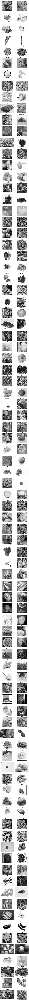

In [10]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Path ke dataset gabungan
path_sub = "combined_dataset"

# Ambil semua nama kelas (tiap folder dalam combined_dataset dianggap sebagai kelas)
class_names = [d for d in os.listdir(path_sub) if os.path.isdir(os.path.join(path_sub, d))]

# Buat subplots: 1 baris per kelas, 2 kolom
fig, axs = plt.subplots(len(class_names), 2, figsize=(8, 3 * len(class_names)))

# Pastikan axs selalu 2D
if len(class_names) == 1:
    axs = np.expand_dims(axs, axis=0)

for i, class_name in enumerate(class_names):
    class_path = os.path.join(path_sub, class_name)

    # Ambil semua file gambar yang sesuai ekstensi
    image_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    if len(image_files) == 0:
        continue  # Skip kelas tanpa gambar

    # Ambil maksimal 2 gambar secara acak
    sample_files = np.random.choice(image_files, min(2, len(image_files)), replace=False)

    for j in range(2):
        ax = axs[i, j]
        if j < len(sample_files):
            img_path = os.path.join(class_path, sample_files[j])
            img = Image.open(img_path).convert("L")  # Skala abu-abu
            ax.imshow(img, cmap='gray')
        ax.set_title(class_name)
        ax.axis('off')

fig.suptitle("Contoh Gambar (2 per Kelas)", fontsize=16)
fig.tight_layout()
plt.show()


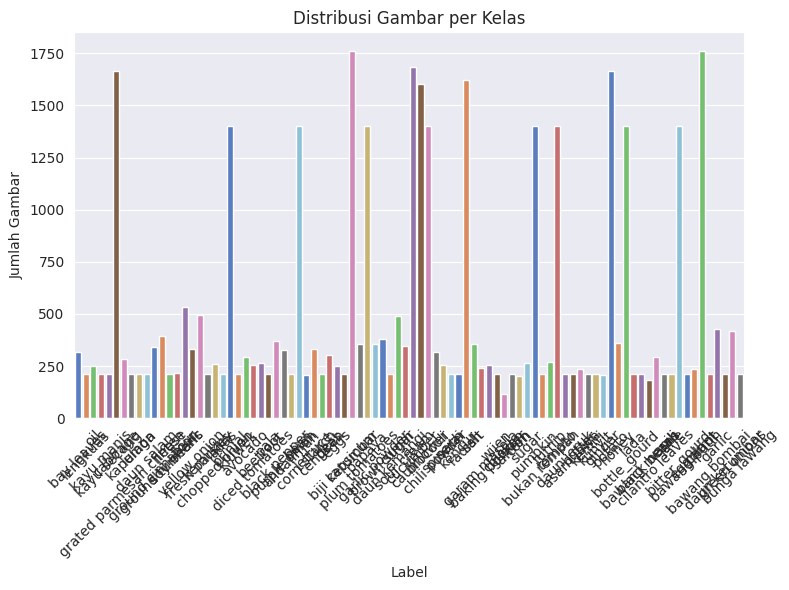

In [11]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Definisikan path sumber
lung_path = "combined_dataset"

# Buat list untuk menyimpan nama file, path lengkap, dan label
file_name = []
labels = []
full_path = []

# Telusuri semua folder dan file
for path, subdirs, files in os.walk(lung_path):
    for name in files:
        if name.lower().endswith(('.png', '.jpg', '.jpeg')):  # Hanya gambar
            full_path.append(os.path.join(path, name))
            labels.append(os.path.basename(path))  # Nama folder sebagai label
            file_name.append(name)

# Buat DataFrame
distribution_train = pd.DataFrame({
    "path": full_path,
    "file_name": file_name,
    "labels": labels
})

# Plot distribusi jumlah gambar per label
plt.figure(figsize=(8, 6))
sns.set_style("darkgrid")
sns.countplot(x="labels", data=distribution_train, palette="muted")
plt.title("Distribusi Gambar per Kelas")
plt.xticks(rotation=45)
plt.xlabel("Label")
plt.ylabel("Jumlah Gambar")
plt.tight_layout()
plt.show()

In [12]:
import os
import pandas as pd
import shutil
from collections import defaultdict
import random

# Folder dataset gabungan
source_dir = "combined_dataset"
balanced_dir = "balanced_dataset"

# Hapus folder jika ada
if os.path.exists(balanced_dir):
    shutil.rmtree(balanced_dir)
    print(f"Folder '{balanced_dir}' beserta isinya berhasil dihapus.")

# Buat ulang folder kosong
os.makedirs(balanced_dir, exist_ok=True)
print(f"Folder '{balanced_dir}' dibuat ulang sebagai folder kosong.")
os.makedirs(balanced_dir, exist_ok=True)

# Ambil semua path dan label
data = []
for path, subdirs, files in os.walk(source_dir):
    for file in files:
        if file.lower().endswith(('.jpg', '.jpeg', '.png')):
            label = os.path.basename(path)
            full_path = os.path.join(path, file)
            data.append((full_path, label))

df = pd.DataFrame(data, columns=["path", "label"])

# Tentukan jumlah maksimal gambar per kelas
max_images = 200  # bisa kamu sesuaikan

# Undersampling: ambil maksimum `max_images` per label
balanced_data = df.groupby('label').apply(lambda x: x.sample(n=min(len(x), max_images), random_state=42)).reset_index(drop=True)

# Salin gambar ke folder baru
for _, row in balanced_data.iterrows():
    dest_label_dir = os.path.join(balanced_dir, row['label'])
    os.makedirs(dest_label_dir, exist_ok=True)
    shutil.copy(row['path'], os.path.join(dest_label_dir, os.path.basename(row['path'])))

Folder 'balanced_dataset' beserta isinya berhasil dihapus.
Folder 'balanced_dataset' dibuat ulang sebagai folder kosong.


<ipython-input-12-1e7f6eda5d6a>:36: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  balanced_data = df.groupby('label').apply(lambda x: x.sample(n=min(len(x), max_images), random_state=42)).reset_index(drop=True)


In [13]:
import os

balanced_dir = "balanced_dataset"

# Buat dictionary untuk simpan jumlah gambar per kelas
count_per_class = {}

# Telusuri tiap folder kelas di balanced_dataset
for kelas in os.listdir(balanced_dir):
    kelas_path = os.path.join(balanced_dir, kelas)
    if os.path.isdir(kelas_path):
        # Hitung jumlah file gambar di folder kelas
        jumlah_gambar = len([f for f in os.listdir(kelas_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
        count_per_class[kelas] = jumlah_gambar

# Tampilkan hasilnya
for kelas, jumlah in count_per_class.items():
    print(f"{kelas}: {jumlah} gambar")


bay leaves: 200 gambar
lengkuas: 200 gambar
oil: 200 gambar
kayu manis: 200 gambar
kayu secang: 200 gambar
cabbage: 200 gambar
grated parmesan cheese: 200 gambar
kapulaga: 200 gambar
lemon: 200 gambar
daun salam: 200 gambar
ground cinnamon: 200 gambar
ground turmeric: 200 gambar
jinten: 200 gambar
soy beans: 200 gambar
flour: 200 gambar
yellow onion: 200 gambar
fresh parsley: 200 gambar
kemukus: 200 gambar
chopped onion: 200 gambar
adas: 200 gambar
brinjal: 200 gambar
kluwek: 200 gambar
avocado: 200 gambar
diced tomatoes: 200 gambar
beetroot: 200 gambar
pala: 200 gambar
black pepper: 200 gambar
purple onion: 200 gambar
andaliman: 200 gambar
bean: 200 gambar
corn starch: 200 gambar
lettuce: 200 gambar
cengkeh: 200 gambar
peas: 200 gambar
eggs: 200 gambar
biji ketumbar: 200 gambar
capsicum: 200 gambar
plum tomatoes: 200 gambar
papaya: 200 gambar
garlic powder: 200 gambar
brown sugar: 200 gambar
daun kemangi: 200 gambar
cumin: 200 gambar
sour cream: 200 gambar
cucumber: 200 gambar
caulifl

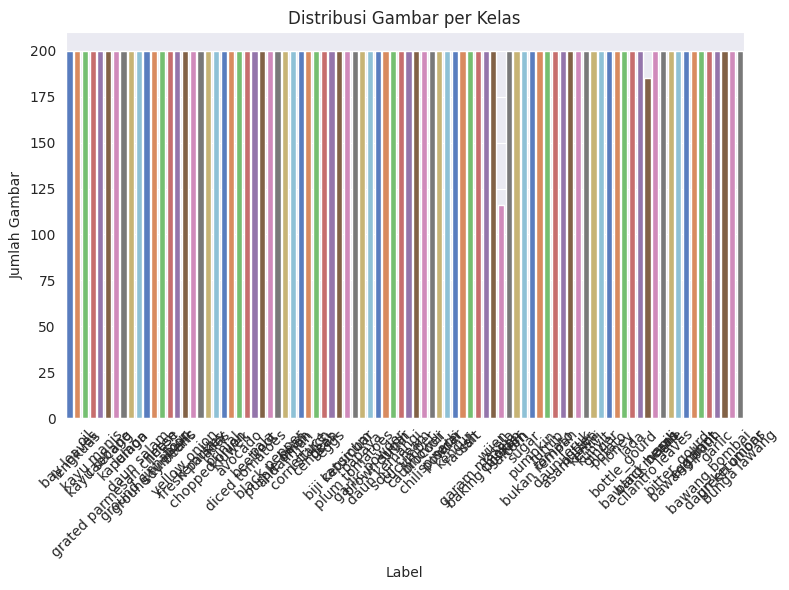

In [14]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Definisikan path sumber
lung_path = "balanced_dataset"

# Buat list untuk menyimpan nama file, path lengkap, dan label
file_name = []
labels = []
full_path = []

# Telusuri semua folder dan file
for path, subdirs, files in os.walk(lung_path):
    for name in files:
        if name.lower().endswith(('.png', '.jpg', '.jpeg')):  # Hanya gambar
            full_path.append(os.path.join(path, name))
            labels.append(os.path.basename(path))  # Nama folder sebagai label
            file_name.append(name)

# Buat DataFrame
distribution_train = pd.DataFrame({
    "path": full_path,
    "file_name": file_name,
    "labels": labels
})

# Plot distribusi jumlah gambar per label
plt.figure(figsize=(8, 6))
sns.set_style("darkgrid")
sns.countplot(x="labels", data=distribution_train, palette="muted")
plt.title("Distribusi Gambar per Kelas")
plt.xticks(rotation=45)
plt.xlabel("Label")
plt.ylabel("Jumlah Gambar")
plt.tight_layout()
plt.show()

#### Split Dataset

In [28]:
# Panggil variabel mypath yang menampung folder dataset gambar
mypath= 'balanced_dataset'

file_name = []
labels = []
full_path = []
for path, subdirs, files in os.walk(mypath):
    for name in files:
        full_path.append(os.path.join(path, name))
        labels.append(path.split('/')[-1])
        file_name.append(name)

# Memasukkan variabel yang sudah dikumpulkan pada looping di atas menjadi sebuah dataframe agar rapi
df = pd.DataFrame({"path":full_path,'file_name':file_name,"labels":labels})
# Melihat jumlah data gambar pada masing-masing label
df.groupby(['labels']).size()

,0
labels,
adas,200
andaliman,200
asam jawa,200
avocado,200
baking powder,200
...,...
tomato,200
turnip,200
vanili,200


In [29]:
# Variabel yang digunakan pada pemisahan data ini di mana variabel x = data path dan y = data labels

X= df['path']
y= df['labels']

# Split dataset awal menjadi data train dan test
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=300)

In [30]:
# Menyatukan ke dalam masing-masing dataframe
df_tr = pd.DataFrame({'path':X_train,'labels':y_train,'set':'train'})
df_te = pd.DataFrame({'path':X_test,'labels':y_test,'set':'test'})

In [31]:
# Gabungkan DataFrame df_tr dan df_te
df_all = pd.concat([df_tr, df_te], ignore_index=True)

print('===================================================== \n')
print(df_all.groupby(['set', 'labels']).size(), '\n')
print('===================================================== \n')

# Cek sampel data
print(df_all.sample(5))

# Memanggil dataset asli yang berisi keseluruhan data gambar yang sesuai dengan labelnya
datasource_path = "balanced_dataset/"
# Membuat variabel Dataset, tempat menampung data yang telah dilakukan pembagian data training dan testing
dataset_path = "Dataset-Final/"


set    labels       
test   adas              26
       andaliman         39
       asam jawa         41
       avocado           35
       baking powder     46
                       ... 
train  tomato           155
       turnip           159
       vanili           165
       wijen            162
       yellow onion     170
Length: 176, dtype: int64 


                                                    path  \
7764                    balanced_dataset/tomato/0802.jpg   
5420   balanced_dataset/grated parmesan cheese/grated...   
13006                  balanced_dataset/cabbage/0345.jpg   
10665                  balanced_dataset/cabbage/0734.jpg   
1205   balanced_dataset/daun kemangi/daun-kemangi_83.jpg   

                       labels    set  
7764                   tomato  train  
5420   grated parmesan cheese  train  
13006                 cabbage  train  
10665                 cabbage  train  
1205             daun kemangi  train  


In [32]:
for index, row in tq(df_all.iterrows()):
    # Deteksi filepath
    file_path = row['path']
    if os.path.exists(file_path) == False:
            file_path = os.path.join(datasource_path,row['labels'],row['image'].split('.')[0])

    # Buat direktori tujuan folder
    if os.path.exists(os.path.join(dataset_path,row['set'],row['labels'])) == False:
        os.makedirs(os.path.join(dataset_path,row['set'],row['labels']))

    # Tentukan tujuan file
    destination_file_name = file_path.split('/')[-1]
    file_dest = os.path.join(dataset_path,row['set'],row['labels'],destination_file_name)

    # Salin file dari sumber ke tujuan
    if os.path.exists(file_dest) == False:
        shutil.copy2(file_path,file_dest)

0it [00:00, ?it/s]

In [33]:
import os

TRAIN_DIR = "Dataset-Final/train/"
TEST_DIR = "Dataset-Final/test/"

# Fungsi hitung jumlah gambar per kelas dalam sebuah folder (train atau test)
def count_images_per_class(base_dir):
    classes = os.listdir(base_dir)  # list folder kelas
    counts = {}
    for cls in classes:
        cls_path = os.path.join(base_dir, cls)
        if os.path.isdir(cls_path):  # pastikan itu folder
            counts[cls] = len(os.listdir(cls_path))
    return counts

# Hitung dan print jumlah gambar per kelas untuk train dan test
train_counts = count_images_per_class(TRAIN_DIR)
test_counts = count_images_per_class(TEST_DIR)

print("Jumlah gambar per kelas di training set:")
for cls, count in train_counts.items():
    print(f"{cls}: {count}")

print("\nJumlah gambar per kelas di test set:")
for cls, count in test_counts.items():
    print(f"{cls}: {count}")


Jumlah gambar per kelas di training set:
bay leaves: 163
lengkuas: 165
oil: 163
kayu manis: 162
kayu secang: 161
cabbage: 155
grated parmesan cheese: 167
kapulaga: 157
lemon: 162
daun salam: 163
ground cinnamon: 161
ground turmeric: 171
jinten: 166
soy beans: 156
flour: 151
yellow onion: 170
fresh parsley: 167
kemukus: 161
chopped onion: 160
adas: 174
brinjal: 156
kluwek: 165
avocado: 165
diced tomatoes: 157
beetroot: 165
pala: 166
black pepper: 146
purple onion: 159
andaliman: 161
bean: 164
corn starch: 159
lettuce: 149
cengkeh: 160
peas: 154
eggs: 150
biji ketumbar: 156
capsicum: 159
plum tomatoes: 156
papaya: 165
garlic powder: 159
brown sugar: 163
daun kemangi: 157
cumin: 163
sour cream: 158
cucumber: 150
cauliflower: 162
broccoli: 157
chili powder: 160
spinach: 169
serai: 166
kencur: 157
radish: 156
salt: 153
garam masala: 157
baking powder: 154
wijen: 162
chicken: 97
saffron: 154
corn: 161
sugar: 164
pumpkin: 165
bukan rempah: 162
turnip: 159
tomato: 155
daun jeruk: 164
asam jawa

In [34]:
# Buat objek ImageDataGenerator yang menormalkan gambar
datagen = ImageDataGenerator(rescale=1/255.,
                             validation_split = 0.2)
test_datagen = ImageDataGenerator(rescale=1. / 255)

train_generator = datagen.flow_from_directory(
    TRAIN_DIR,
    batch_size=32,
    target_size=(150, 150),
    color_mode="grayscale",
    class_mode='categorical',  # Bukan 'binary'
    subset='training',
    shuffle=True
)
validation_generator = datagen.flow_from_directory(
    TRAIN_DIR,
    batch_size=32,
    target_size=(150, 150),
    color_mode="grayscale",
    class_mode='categorical',  # Bukan 'binary'
    subset='validation',
    shuffle=False
)
test_generator = test_datagen.flow_from_directory(
    TEST_DIR,
    batch_size=1,
    target_size=(150, 150),
    color_mode="grayscale",
    class_mode='categorical',  # Bukan 'binary'
    shuffle=False
)

Found 11234 images belonging to 88 classes.
Found 2766 images belonging to 88 classes.
Found 3501 images belonging to 88 classes.


## Modelling

In [35]:

# tf.keras.backend.clear_session()

####################### Init sequential model ##################################
model_1 = Sequential()

# ######################### Input layer with Fully Connected Layer ################################
# 1st Convolutional layer, Batch Normalization layer, and Pooling layer
model_1.add(Conv2D(32, (3, 3), padding='same', activation='relu', input_shape=(150,150,1)))
model_1.add(BatchNormalization())
model_1.add(MaxPool2D((2, 2)))

# 2nd Convolutional layer, Batch Normalization layer, and Pooling layer
model_1.add(Conv2D(32, (4, 4),padding='same', activation='relu'))
model_1.add(BatchNormalization())
model_1.add(MaxPool2D((2, 2)))

# 3rd Convolutional layer, Batch Normalization layer, and Pooling layer
model_1.add(Conv2D(32, (7, 7), padding='same', activation='relu'))
model_1.add(BatchNormalization())
model_1.add(MaxPool2D((2, 2)))

# Flatten layer
model_1.add(Flatten())
# 1nd Dense Layer
model_1.add(Dense(128, activation = 'relu'))
# 1nd Dropout Layer
model_1.add(Dropout(0.5))
# 2nd Dense Layer
model_1.add(Dense(64, activation = 'relu'))
# 2nd Dropout Layer
model_1.add(Dropout(0.3))

# Final Dense layer => For output prediction 1 mean (binary class in dataset), sigmoid for binary cases
model_1.add(Dense(1, activation='sigmoid'))
######################### Fully Connected Layer ################################

######################### Compile Model ################################
model_1.compile(optimizer=tf.keras.optimizers.RMSprop(),
                loss='binary_crossentropy',
                metrics=['accuracy'])

# Summary of the Model Architecture
print(model_1.summary())

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)               │ (None, 150, 150, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 150, 150, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 75, 75, 32)     │        16,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 75, 75, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 37, 37, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 37, 37, 32)     │        50,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 37, 37, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 18, 18, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 10368)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 128)            │     1,327,232 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,402,881 (5.35 MB)

 Trainable params: 1,402,689 (5.35 MB)

 Non-trainable params: 192 (768.00 B)

None


In [37]:
from collections import Counter

# Hitung class weights dari label numerik train_generator
labels_train = train_generator.classes
counts = Counter(labels_train)
total = sum(counts.values())
class_weights = {cls: (1 / count) * total / 2.0 for cls, count in counts.items()}

print("Class weights:", class_weights)

# Definisikan model
model_1 = Sequential([
    Conv2D(32, (3,3), activation='relu', input_shape=(150,150,1)),  # ubah channel jadi 1
    MaxPooling2D(2,2),
    Conv2D(64, (3,3), activation='relu'),
    MaxPooling2D(2,2),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(88, activation='softmax')
])

model_1.compile(
    optimizer='adam',
    loss='categorical_crossentropy',  # sesuai one-hot labels
    metrics=['accuracy']
)

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
model_ckpt = ModelCheckpoint('best_model.h5', monitor='val_accuracy', save_best_only=True)

# Fit model
history_1 = model_1.fit(
    train_generator,
    epochs=10,
    validation_data=validation_generator,
    class_weight=class_weights,
    callbacks=[early_stop, model_ckpt]
)

Class weights: {np.int32(0): 40.121428571428574, np.int32(1): 43.542635658914726, np.int32(2): 43.8828125, np.int32(3): 42.553030303030305, np.int32(4): 45.29838709677419, np.int32(5): 45.66666666666667, np.int32(6): 43.8828125, np.int32(7): 45.66666666666667, np.int32(8): 42.87786259541985, np.int32(9): 42.553030303030305, np.int32(10): 42.553030303030305, np.int32(11): 44.936, np.int32(12): 41.3014705882353, np.int32(13): 47.20168067226891, np.int32(14): 48.00854700854701, np.int32(15): 44.936, np.int32(16): 44.936, np.int32(17): 44.579365079365076, np.int32(18): 42.87786259541985, np.int32(19): 43.20769230769231, np.int32(20): 44.936, np.int32(21): 43.20769230769231, np.int32(22): 45.29838709677419, np.int32(23): 43.8828125, np.int32(24): 43.542635658914726, np.int32(25): 43.20769230769231, np.int32(26): 43.8828125, np.int32(27): 72.01282051282051, np.int32(28): 43.8828125, np.int32(29): 43.8828125, np.int32(30): 44.22834645669291, np.int32(31): 43.542635658914726, np.int32(32): 43.

/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - accuracy: 0.0302 - loss: 194.5414

352/352 ━━━━━━━━━━━━━━━━━━━━ 61s 154ms/step - accuracy: 0.0303 - loss: 194.5244 - val_accuracy: 0.0745 - val_loss: 4.0548
Epoch 2/10
352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - accuracy: 0.1426 - loss: 161.3408

352/352 ━━━━━━━━━━━━━━━━━━━━ 48s 136ms/step - accuracy: 0.1427 - loss: 161.3189 - val_accuracy: 0.1692 - val_loss: 3.5058
Epoch 3/10
352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - accuracy: 0.4750 - loss: 94.4840

352/352 ━━━━━━━━━━━━━━━━━━━━ 48s 137ms/step - accuracy: 0.4751 - loss: 94.4743 - val_accuracy: 0.2115 - val_loss: 3.8039
Epoch 4/10
352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - accuracy: 0.8091 - loss: 34.3805

352/352 ━━━━━━━━━━━━━━━━━━━━ 49s 138ms/step - accuracy: 0.8091 - loss: 34.3770 - val_accuracy: 0.2158 - val_loss: 4.9612
Epoch 5/10
352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - accuracy: 0.9422 - loss: 11.2977

352/352 ━━━━━━━━━━━━━━━━━━━━ 48s 137ms/step - accuracy: 0.9422 - loss: 11.2971 - val_accuracy: 0.2227 - val_loss: 6.3173
Epoch 6/10
352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step - accuracy: 0.9779 - loss: 4.4770

352/352 ━━━━━━━━━━━━━━━━━━━━ 48s 135ms/step - accuracy: 0.9779 - loss: 4.4774 - val_accuracy: 0.2274 - val_loss: 6.5230
Epoch 7/10
352/352 ━━━━━━━━━━━━━━━━━━━━ 47s 133ms/step - accuracy: 0.9915 - loss: 2.8373 - val_accuracy: 0.2256 - val_loss: 6.8396


## Evaluasi dan Visualisasi

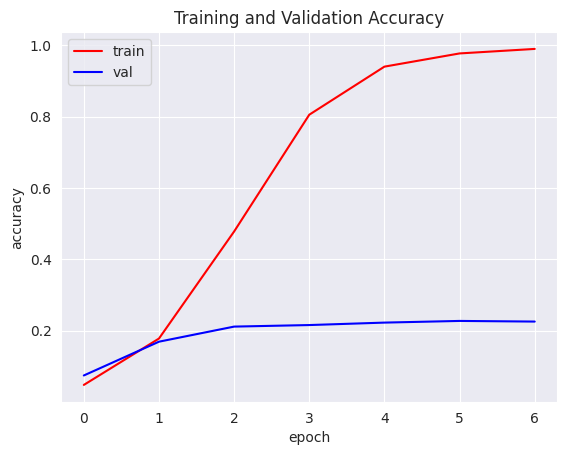

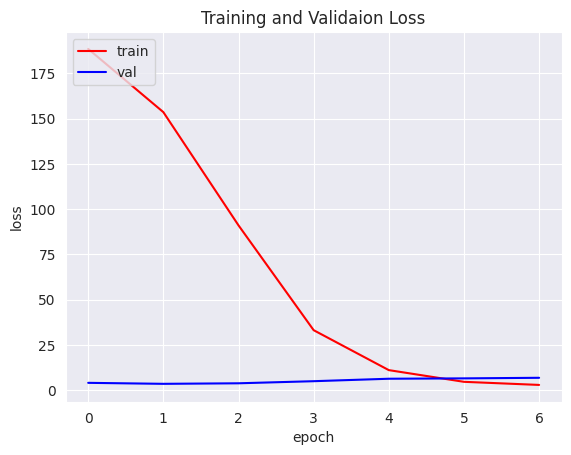

In [38]:
acc = history_1.history['accuracy']
val_acc = history_1.history['val_accuracy']
loss = history_1.history['loss']
val_loss = history_1.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r')
plt.plot(epochs, val_acc, 'b')
plt.title('Training and Validation Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

plt.plot(epochs, loss, 'r')
plt.plot(epochs, val_loss, 'b')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.title('Training and Validaion Loss')
plt.show()